## Train sea lion classifier with hog + svm

In [1]:
INPUT_DIR = '../../input/kaggle-sea-lion/02/'
INPUT_DIR2 = '../../input/kaggle-sea-lion/Train/'
OUTPUT_DIR = '../../output/kaggle-sea-lion/05/'
# IMAGE_DIMS = (42,42,3)
#IMAGE_DIMS = (84,84,3)
#IMAGE_DIMS = (32,32,3)
IMAGE_DIMS = (50,50,3)

INPUT_DATASET_NAME = 'lion-patches-0px'

RECREATE_OUTPUT_DIR = False

OUTPUT_WEIGHT = (1,1,1,1,1,5)
INPUT_RANGE = 1

BATCH_SIZE=64

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import sklearn
import os
import glob
import cv2
from sklearn import svm
from sklearn import datasets
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
import sklearn.metrics as metrics
import sklearn.cluster as cluster
import skimage
import random
import itertools

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras import models

from modules.logging import logger
import modules.utils as utils
from modules.utils import Timer
import modules.logging
import modules.lions as lions
import modules.objectdetect as objectdetect


Using TensorFlow backend.


## Prepare

### Prepare output dir

In [3]:
utils.mkdirs(OUTPUT_DIR, dirs=['weights'], recreate=RECREATE_OUTPUT_DIR)
modules.logging.setup_file_logger(OUTPUT_DIR + 'out.log')
WEIGHTS_DIR = OUTPUT_DIR + 'weights/'
input_dataset_path = INPUT_DIR + utils.dataset_name(INPUT_DATASET_NAME, IMAGE_DIMS)

logger.info('Output dirs created')

2017-05-21 01:58:43,048 INFO Output dirs created


### Prepare train, validate and test data flows

In [4]:
logger.info('Using dataset ' + input_dataset_path + ' as input')
h5file = h5py.File(input_dataset_path, 'r')

logger.info('Using dataset ' + input_dataset_path + ' as input')
h5file = h5py.File(input_dataset_path, 'r')

#used for image augmentation (creating new images for balancing)
image_augmentation_generator = ImageDataGenerator(
        featurewise_center=False,
        samplewise_center=False,
        featurewise_std_normalization=False,
        samplewise_std_normalization=False,
        zca_whitening=False,
        rotation_range=359,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0,
        horizontal_flip=True,
        vertical_flip=True)

image_randomize_generator = image_augmentation_generator

logger.info('preparing train data')
train_batch_generator = utils.BatchGeneratorXYH5(h5file, start_ratio=0, end_ratio=INPUT_RANGE)
train_balance_generator = utils.ClassBalancerGeneratorXY(train_batch_generator,
                                                         image_augmentation=image_augmentation_generator,
                                                         output_weight=OUTPUT_WEIGHT,
                                                         max_augmentation_ratio=5,
                                                         max_undersampling_ratio=1,
                                                         enforce_max_ratios=False,
                                                         batch_size=BATCH_SIZE,
                                                         start_ratio=0, end_ratio=0.7)
train_generator = utils.image_augmentation_xy(train_balance_generator.flow(), image_randomize_generator)
logger.info('train size=' + str(train_balance_generator.size) + ' batches=' + str(train_balance_generator.nr_batches))


logger.info('preparing valid data')
valid_batch_generator = utils.BatchGeneratorXYH5(h5file, start_ratio=0, end_ratio=INPUT_RANGE)
valid_balance_generator = utils.ClassBalancerGeneratorXY(valid_batch_generator,
                                                         image_augmentation=image_augmentation_generator,
                                                         output_weight=OUTPUT_WEIGHT,
                                                         max_augmentation_ratio=5,
                                                         max_undersampling_ratio=1,
                                                         enforce_max_ratios=False,
                                                         batch_size=BATCH_SIZE,
                                                         start_ratio=0.7, end_ratio=0.85)
logger.info('valid size=' + str(valid_balance_generator.size) + ' batches=' + str(valid_balance_generator.nr_batches))



logger.info('preparing test data')
test_batch_generator = utils.BatchGeneratorXYH5(h5file, start_ratio=0, end_ratio=INPUT_RANGE)
test_balance_generator = utils.ClassBalancerGeneratorXY(test_batch_generator,
                                                         image_augmentation=image_augmentation_generator,
                                                         output_weight=OUTPUT_WEIGHT,
                                                         max_augmentation_ratio=5,
                                                         max_undersampling_ratio=1,
                                                         enforce_max_ratios=False,
                                                         batch_size=BATCH_SIZE,
                                                         start_ratio=0.85, end_ratio=1)
logger.info('test size=' + str(test_balance_generator.size) + ' batches=' + str(test_balance_generator.nr_batches))


2017-05-21 01:58:43,079 INFO Using dataset ../../input/kaggle-sea-lion/02/lion-patches-0px-50-50.h5 as input
2017-05-21 01:58:43,090 INFO Using dataset ../../input/kaggle-sea-lion/02/lion-patches-0px-50-50.h5 as input
2017-05-21 01:58:43,094 INFO preparing train data
2017-05-21 01:58:43,096 INFO loading input data for class distribution analysis...
2017-05-21 01:58:43,098 INFO loading Y from raw dataset
2017-05-21 01:58:43,101 INFO > [started] generator dump...


2222/2222

2017-05-21 01:58:43,346 INFO > [done]    generator dump (245.423 ms)
2017-05-21 01:58:43,349 INFO raw sample class distribution
2017-05-21 01:58:43,350 INFO 0: 78
2017-05-21 01:58:43,352 INFO 1: 44
2017-05-21 01:58:43,353 INFO 2: 675
2017-05-21 01:58:43,355 INFO 3: 150
2017-05-21 01:58:43,356 INFO 4: 281
2017-05-21 01:58:43,357 INFO 5: 994
2017-05-21 01:58:43,359 INFO overall output samples per class: 264
2017-05-21 01:58:43,360 INFO augmentation/undersampling ratio per class
2017-05-21 01:58:43,362 INFO SETUP FLOW 0 0.7
2017-05-21 01:58:43,363 INFO calculating source range according to start/end range of the desired output..
2017-05-21 01:58:43,364 INFO output distribution for this flow
2017-05-21 01:58:43,365 INFO 0: 184 (3.38)
2017-05-21 01:58:43,367 INFO 1: 184 (6.00)
2017-05-21 01:58:43,368 INFO 2: 184 (0.39)
2017-05-21 01:58:43,370 INFO 3: 184 (1.76)
2017-05-21 01:58:43,371 INFO 4: 184 (0.94)
2017-05-21 01:58:43,372 INFO 5: 923 (1.33)
2017-05-21 01:58:43,376 INFO source range: 0-

2222/2222

2017-05-21 01:58:43,573 INFO > [done]    generator dump (189.256 ms)
2017-05-21 01:58:43,576 INFO raw sample class distribution
2017-05-21 01:58:43,577 INFO 0: 78
2017-05-21 01:58:43,579 INFO 1: 44
2017-05-21 01:58:43,580 INFO 2: 675
2017-05-21 01:58:43,582 INFO 3: 150
2017-05-21 01:58:43,583 INFO 4: 281
2017-05-21 01:58:43,584 INFO 5: 994
2017-05-21 01:58:43,586 INFO overall output samples per class: 264
2017-05-21 01:58:43,587 INFO augmentation/undersampling ratio per class
2017-05-21 01:58:43,588 INFO SETUP FLOW 0.7 0.85
2017-05-21 01:58:43,590 INFO calculating source range according to start/end range of the desired output..
2017-05-21 01:58:43,591 INFO output distribution for this flow
2017-05-21 01:58:43,592 INFO 0: 39 (3.38)
2017-05-21 01:58:43,594 INFO 1: 39 (6.00)
2017-05-21 01:58:43,595 INFO 2: 39 (0.39)
2017-05-21 01:58:43,597 INFO 3: 39 (1.76)
2017-05-21 01:58:43,598 INFO 4: 39 (0.94)
2017-05-21 01:58:43,599 INFO 5: 198 (1.33)
2017-05-21 01:58:43,603 INFO source range: 1689

2222/2222

2017-05-21 01:58:43,794 INFO > [done]    generator dump (182.551 ms)
2017-05-21 01:58:43,797 INFO raw sample class distribution
2017-05-21 01:58:43,799 INFO 0: 78
2017-05-21 01:58:43,800 INFO 1: 44
2017-05-21 01:58:43,802 INFO 2: 675
2017-05-21 01:58:43,803 INFO 3: 150
2017-05-21 01:58:43,805 INFO 4: 281
2017-05-21 01:58:43,807 INFO 5: 994
2017-05-21 01:58:43,808 INFO overall output samples per class: 264
2017-05-21 01:58:43,810 INFO augmentation/undersampling ratio per class
2017-05-21 01:58:43,811 INFO SETUP FLOW 0.85 1
2017-05-21 01:58:43,813 INFO calculating source range according to start/end range of the desired output..
2017-05-21 01:58:43,814 INFO output distribution for this flow
2017-05-21 01:58:43,816 INFO 0: 39 (3.38)
2017-05-21 01:58:43,817 INFO 1: 39 (6.00)
2017-05-21 01:58:43,819 INFO 2: 39 (0.39)
2017-05-21 01:58:43,820 INFO 3: 39 (1.76)
2017-05-21 01:58:43,821 INFO 4: 39 (0.94)
2017-05-21 01:58:43,823 INFO 5: 198 (1.33)
2017-05-21 01:58:43,826 INFO source range: 1942-2

### Dump train, validation and test data

In [5]:
logger.info('Loading train/valid data...')
X_train, Y_train = utils.dump_xy_to_array(train_generator, train_balance_generator.size, x=True, y=True)
X_valid, Y_valid = utils.dump_xy_to_array(valid_balance_generator.flow(), valid_balance_generator.size, x=True, y=True)
X_test, Y_test = utils.dump_xy_to_array(test_balance_generator.flow(), test_balance_generator.size, x=True, y=True)

Y_train = utils.onehot_to_label(Y_train)
Y_valid = utils.onehot_to_label(Y_valid)
Y_test = utils.onehot_to_label(Y_test)

print(X_train.shape)
print(Y_train.shape)

test_img = cv2.cvtColor(X_train[0],cv2.COLOR_BGR2GRAY).astype('u1')
test_img2 = cv2.cvtColor(X_train[1],cv2.COLOR_BGR2GRAY).astype('u1')

2017-05-21 01:58:43,840 INFO Loading train/valid data...
2017-05-21 01:58:43,842 INFO > [started] generator dump...
2017-05-21 01:58:43,844 INFO starting new flow...


1856/1847

2017-05-21 01:58:45,897 INFO > [done]    generator dump (2054.145 ms)
2017-05-21 01:58:45,898 INFO > [started] generator dump...
2017-05-21 01:58:45,899 INFO starting new flow...


448/396

2017-05-21 01:58:46,057 INFO > [done]    generator dump (158.608 ms)
2017-05-21 01:58:46,059 INFO > [started] generator dump...
2017-05-21 01:58:46,060 INFO starting new flow...


448/396

2017-05-21 01:58:46,213 INFO > [done]    generator dump (154.071 ms)


(1847, 50, 50, 3)
(1847,)


## Traditional HOG approach

### Explore traditional HOG capabilities

2017-05-21 01:58:46,242 INFO Calculate HOG features...
2017-05-21 01:58:47,804 INFO Training SVM...
2017-05-21 01:59:12,462 INFO Train accuracy: 0.564158094207
2017-05-21 01:59:13,299 INFO Validation accuracy: 0.54797979798
2017-05-21 01:59:15,846 INFO Test accuracy: 0.507575757576
2017-05-21 01:59:15,848 INFO Accuracy: 0.54797979798
2017-05-21 01:59:15,850 INFO Number of test samples: 396
2017-05-21 01:59:15,852 INFO Kappa score: 0.0 (-1 bad; 0 just luck; 1 great)
/usr/local/lib/python3.4/dist-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
2017-05-21 01:59:15,856 INFO 
             precision    recall  f1-score   support

          0       0.00      0.00      0.00       179
          1       0.55      1.00      0.71       217

avg / total       0.30      0.55      0.39       396

/notebooks/datascience-snippets/kaggle-

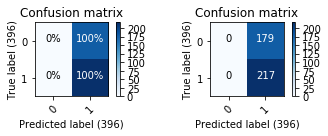

In [6]:
ovr = OneVsRestClassifier(SVC(probability=True))

logger.info('Calculate HOG features...')
X_train_hog = np.array([utils.extract_hog(x) for x in X_train])
X_valid_hog = np.array([utils.extract_hog(x) for x in X_valid])
X_test_hog = np.array([utils.extract_hog(x) for x in X_test])

#train just on two classes: 1-lion or 0-non-lion
Y_train_2 = np.array([0 if x==5 else 1 for x in Y_train])
Y_valid_2 = np.array([0 if x==5 else 1 for x in Y_valid])
Y_test_2 = np.array([0 if x==5 else 1 for x in Y_test])

logger.info('Training SVM...')
svm_model = ovr.fit(X_train_hog, Y_train_2)

Y_train_pred = svm_model.predict(X_train_hog)
acc = metrics.accuracy_score(Y_train_2, Y_train_pred)
logger.info('Train accuracy: ' + str(acc))

Y_valid_pred = svm_model.predict(X_valid_hog)
acc = metrics.accuracy_score(Y_valid_2, Y_valid_pred)
logger.info('Validation accuracy: ' + str(acc))

Y_test_pred = svm_model.predict(X_test_hog)
Y_test_prob = svm_model.predict_proba(X_test_hog)
Y_test_func = svm_model.decision_function(X_test_hog)

acc = metrics.accuracy_score(Y_test_2, Y_test_pred)
logger.info('Test accuracy: ' + str(acc))

logger.debug("Done")

utils.evaluate_predictions(Y_valid_2, Y_valid_pred)

2017-05-21 01:59:16,513 INFO > [started] sliding_window...


323/328 [=========================>] 98% 0s remaining=0s sliding window

2017-05-21 01:59:17,257 INFO > [done]    sliding_window (743.537 ms)
2017-05-21 01:59:17,263 INFO > [started] non_max_suppression. boxes=59...
2017-05-21 01:59:17,266 INFO > [done]    non_max_suppression. boxes=59 (3.201 ms)


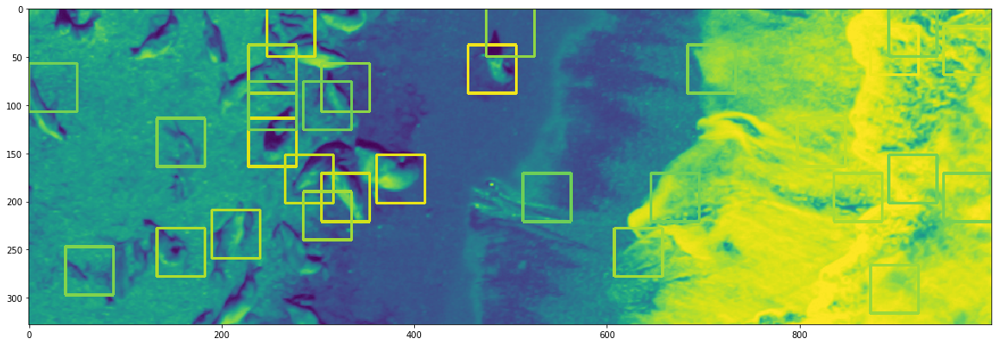

In [7]:
def proportional_one(values, value):
    """
        Normalizes value between 0-1 according to min/max among 'values' array
    """
    maxx = np.max(values)
    minn = np.min(values)
    return (value - minn)/(maxx-minn)

def eval_region(region):
#    utils.show_image(region)
    try:
        region_hog = [utils.extract_hog(region)]
    #     score = svm_model.decision_function(region_hog)
        score = svm_model.predict_proba(region_hog)
        return score[0][1] * 255
    except:
        return 0

img_path = INPUT_DIR2 + '41.jpg'
img = cv2.imread(img_path,0)
img = img[3000:4000,2500:3500]


img2 = img.copy()
# region_generator = sliding_window_generator(img, step=(19,19), window=(84,84))
# good_regions, imgs = evaluate_regions(region_generator, eval_region, score_threshold=50, apply_non_max_suppression=False, supression_overlap_threshold=0)

# for i, region in enumerate(good_regions):
#     score = int(good_regions[i][4])
#     cv2.rectangle(img, (region[0],region[1]), (region[2],region[3]), color=(score,score,score), thickness=2)    

# utils.show_image(img, size=20)


region_generator = objectdetect.sliding_window_generator(img2, step=(19,19), window=IMAGE_DIMS)
good_regions, imgs = objectdetect.evaluate_regions(region_generator, eval_region, score_threshold=200, apply_non_max_suppression=True, supression_overlap_threshold=0.4)

for i, region in enumerate(good_regions):
    score = int(good_regions[i][4])
    cv2.rectangle(img2, (region[1],region[0]), (region[3]+region[1],region[2]+region[0]), color=(score,score,score), thickness=2)    

utils.show_image(img2, size=20)


## Circular HOG approach

### Explore Circular HOG capabilities

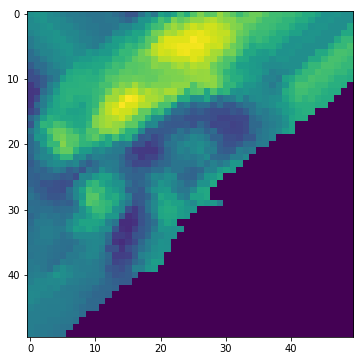

2


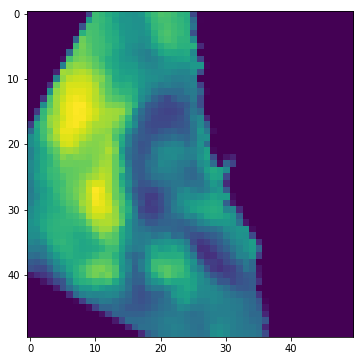

-0.13539789099


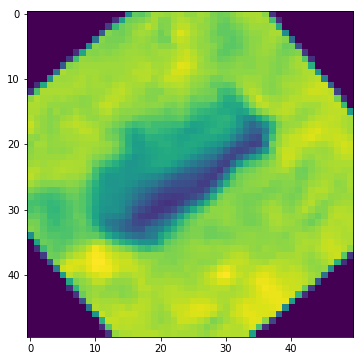

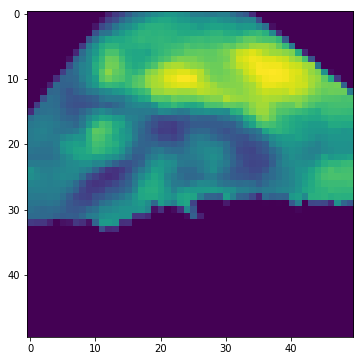

0.230802625738


In [8]:
# logger.info('Extracting HOG features...')
# X_train = utils.extract_hogs(X_train)
Y_train = utils.onehot_to_label(Y_train)
# X_valid = utils.extract_hogs(X_valid)
Y_valid = utils.onehot_to_label(Y_valid)
Y_test = utils.onehot_to_label(Y_test)
# HOG got just 37% accuracy on sample kaggle data

from modules.chog import CircularHOGExtractor
ch = CircularHOGExtractor()

img1 = skimage.transform.rotate(test_img.astype('float'), 90)
utils.show_image(img1)
res1 = ch.extract(img1)

img1 = skimage.transform.rotate(test_img.astype('float'), 152)
print(len(img1.shape))
utils.show_image(img1)
res2 = ch.extract(img1)

print(np.sum(np.array(res1)-np.array(res2)))


img1 = skimage.transform.rotate(test_img2.astype('float'), 310)
utils.show_image(img1)
res1 = ch.extract(img1)

img1 = skimage.transform.rotate(test_img.astype('float'), 52)
utils.show_image(img1)
res2 = ch.extract(img1)

print(np.sum(np.array(res1)-np.array(res2)))


#print(cv2.getBuildInformation())

# logger.info('Extracting ORB features...')
# img = test_img.astype('u1')
# #orb = cv2.ORB_create(edgeThreshold=15, patchSize=31, nlevels=8, fastThreshold=20, scaleFactor=1.2, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE, firstLevel=0, nfeatures=500)
# orb = cv2.ORB_create(edgeThreshold=10, patchSize=20, nlevels=8, fastThreshold=20, scaleFactor=1.2, WTA_K=2, scoreType=cv2.ORB_HARRIS_SCORE, firstLevel=0, nfeatures=500)
# #orb = cv2.ORB_create()
# kp, des = orb.detectAndCompute(img, None)
# plt.hist(des.flatten(), bins=20)
# plt.show()

# img2 = cv2.drawKeypoints(img, kp, None, color=(0,255,0), flags=cv2.DrawMatchesFlags_DEFAULT)
#bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# utils.show_image(img2, is_bgr=True)

### Extract Circular HOG Features

In [9]:
logger.info('Extracting chog for train...')
X_chog_train = np.array([ch.extract(cv2.cvtColor(im,cv2.COLOR_BGR2GRAY).astype('u1')) for im in X_train])
logger.info('Extracting chog for validation...')
X_chog_valid = np.array([ch.extract(cv2.cvtColor(im,cv2.COLOR_BGR2GRAY).astype('u1')) for im in X_valid])
logger.info('Extracting chog for test...')
X_chog_test = np.array([ch.extract(cv2.cvtColor(im,cv2.COLOR_BGR2GRAY).astype('u1')) for im in X_test])
logger.info('done')

2017-05-21 01:59:18,467 INFO Extracting chog for train...
2017-05-21 01:59:26,300 INFO Extracting chog for validation...
2017-05-21 01:59:27,924 INFO Extracting chog for test...
2017-05-21 01:59:29,500 INFO done


### Explore KMeans clustering of Circular HOG features

In [10]:
kmeans = cluster.KMeans(n_clusters=2).fit(X_chog_train)

2017-05-21 01:59:29,652 INFO Train accuracy with KMeans: 0.877639415268
2017-05-21 01:59:29,655 INFO Validation accuracy with KMeans: 0.729797979798
2017-05-21 01:59:29,658 INFO Test accuracy with KMeans: 0.719696969697
2017-05-21 01:59:29,660 INFO Accuracy: 0.729797979798
2017-05-21 01:59:29,662 INFO Number of test samples: 396
2017-05-21 01:59:29,665 INFO Kappa score: 0.426226844329 (-1 bad; 0 just luck; 1 great)
2017-05-21 01:59:29,667 INFO 
             precision    recall  f1-score   support

          0       0.67      0.99      0.80       217
          1       0.96      0.42      0.58       179

avg / total       0.80      0.73      0.70       396

2017-05-21 01:59:29,669 INFO Accuracy per class:
2017-05-21 01:59:29,670 INFO 0: 67.3%
2017-05-21 01:59:29,672 INFO 1: 96.2%
2017-05-21 01:59:29,673 INFO Confusion matrix:
2017-05-21 01:59:29,675 INFO 
[[214   3]
 [104  75]]


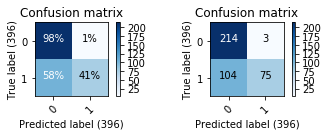

In [11]:
Y_train_pred = kmeans.predict(X_chog_train)
Y_train_2 = np.array([1 if x==5 else 0 for x in Y_train])
acc = metrics.accuracy_score(Y_train_2, Y_train_pred)
logger.info('Train accuracy with KMeans: ' + str(acc))

Y_valid_pred = kmeans.predict(X_chog_valid)
Y_valid_2 = np.array([1 if x==5 else 0 for x in Y_valid])
# print(Y_valid_2)
# print(Y_valid_pred)
acc = metrics.accuracy_score(Y_valid_2, Y_valid_pred)
logger.info('Validation accuracy with KMeans: ' + str(acc))

Y_test_pred = kmeans.predict(X_chog_test)
Y_test_2 = np.array([1 if x==5 else 0 for x in Y_test])
acc = metrics.accuracy_score(Y_test_2, Y_test_pred)
logger.info('Test accuracy with KMeans: ' + str(acc))

utils.evaluate_predictions(Y_valid_2, Y_valid_pred)

2017-05-21 01:59:29,995 INFO showing 10 images
2017-05-21 01:59:29,998 INFO > [started] generating image patches. rows=2; cols=10...
/notebooks/datascience-snippets/kaggle-sea-lion/modules/utils.py:638: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if(image_labels!=None):


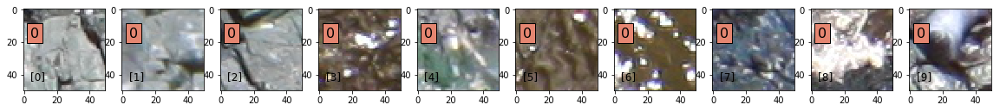

2017-05-21 01:59:30,897 INFO > [done]    generating image patches. rows=2; cols=10 (898.346 ms)


In [12]:
utils.show_images(X_test[0:10], image_labels=Y_test_pred, cols=10, size=2)

### Train SVM over Circular HOG Features

2017-05-21 01:59:30,920 INFO Training SVM...
2017-05-21 01:59:33,997 INFO Train accuracy: 0.874932322685
2017-05-21 01:59:34,101 INFO Validation accuracy: 0.724747474747
2017-05-21 01:59:34,299 INFO Test accuracy: 0.719696969697
2017-05-21 01:59:34,301 INFO Accuracy: 0.724747474747
2017-05-21 01:59:34,304 INFO Number of test samples: 396
2017-05-21 01:59:34,308 INFO Kappa score: 0.414899962045 (-1 bad; 0 just luck; 1 great)
2017-05-21 01:59:34,310 INFO 
             precision    recall  f1-score   support

          0       0.96      0.41      0.57       179
          1       0.67      0.99      0.80       217

avg / total       0.80      0.72      0.70       396

2017-05-21 01:59:34,311 INFO Accuracy per class:
2017-05-21 01:59:34,312 INFO 0: 96.1%
2017-05-21 01:59:34,314 INFO 1: 66.9%
2017-05-21 01:59:34,315 INFO Confusion matrix:
2017-05-21 01:59:34,317 INFO 
[[ 73 106]
 [  3 214]]


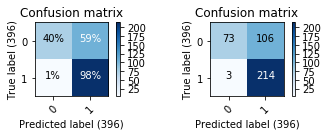

In [13]:
#BATCH_SIZE = 10
#for batch in range(round(train_balance_generator.size/BATCH_SIZE)):
#    logger.info('Batch ' + str(batch) + '...')
#    X_train, Y_train = utils.dump_xy_to_array(train_generator, BATCH_SIZE, x=True, y=True)

#X = utils.extract_hogs(X_train)
#Y_true = utils.onehot_to_label(Y_train)
#Y_true = np.array([l if l==5 else 0 for l in Y_true])

logger.info('Training SVM...')
#ovr = OneVsRestClassifier(LinearSVC(random_state=0))
ovr = OneVsRestClassifier(SVC(probability=True))

#train just on two classes: 1-lion or 0-non-lion
Y_train_2 = np.array([0 if x==5 else 1 for x in Y_train])
Y_valid_2 = np.array([0 if x==5 else 1 for x in Y_valid])
Y_test_2 = np.array([0 if x==5 else 1 for x in Y_test])

svm_model = ovr.fit(X_chog_train, Y_train_2)

Y_train_pred = svm_model.predict(X_chog_train)
acc = metrics.accuracy_score(Y_train_2, Y_train_pred)
logger.info('Train accuracy: ' + str(acc))

Y_valid_pred = svm_model.predict(X_chog_valid)
acc = metrics.accuracy_score(Y_valid_2, Y_valid_pred)
logger.info('Validation accuracy: ' + str(acc))

Y_test_pred = svm_model.predict(X_chog_test)
Y_test_prob = svm_model.predict_proba(X_chog_test)
acc = metrics.accuracy_score(Y_test_2, Y_test_pred)
logger.info('Test accuracy: ' + str(acc))

logger.debug("Done")

utils.evaluate_predictions(Y_valid_2, Y_valid_pred)

### Show prediction images

2017-05-21 01:59:34,641 INFO showing 10 images
2017-05-21 01:59:34,644 INFO > [started] generating image patches. rows=2; cols=10...


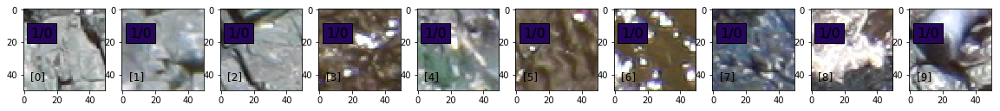

2017-05-21 01:59:35,670 INFO > [done]    generating image patches. rows=2; cols=10 (1025.237 ms)


In [14]:
Y_test_pred
Y_test_true0 = utils.onehot_to_label(Y_test_2)
il = []
for i,yp in enumerate(Y_test_pred):
    il.append(str(yp) + '/' + str(Y_test_true0[i]))

utils.show_images(X_test[0:10], image_labels=il, cols=10, size=2)

### Find lions on image

In [15]:
X_train_hist = [cv2.calcHist([cv2.cvtColor(im,cv2.COLOR_BGR2HSV)],[0], None, [64], [0,180]) for im in X_train]
X_train_hist = np.array(X_train_hist).reshape(-1,64)
X_train_hist_min = np.min(X_train_hist, axis=1)
X_train_hist_max = np.max(X_train_hist, axis=1)
print(X_train_hist_min.shape)
print(X_train_hist_max.shape)

(1847,)
(1847,)


preparing blur


2017-05-21 02:05:47,204 INFO > [started] sliding_window...


3743/3744 [=========================>] 99% 82s remaining=0s sliding windoww

2017-05-21 02:07:09,994 INFO > [done]    sliding_window (82789.876 ms)
2017-05-21 02:07:09,997 INFO > [started] non_max_suppression. boxes=18937...
2017-05-21 02:08:20,150 INFO > [done]    non_max_suppression. boxes=18937 (70152.889 ms)


regions found:
5635


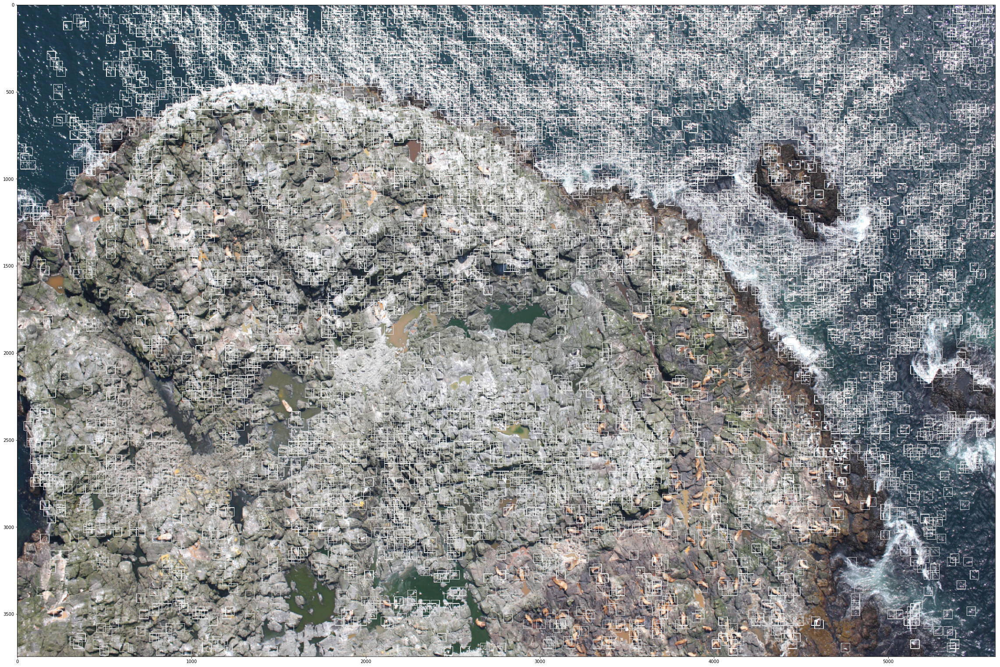

2017-05-21 02:08:24,341 INFO showing 100 images
2017-05-21 02:08:24,344 INFO > [started] generating image patches. rows=11; cols=10...


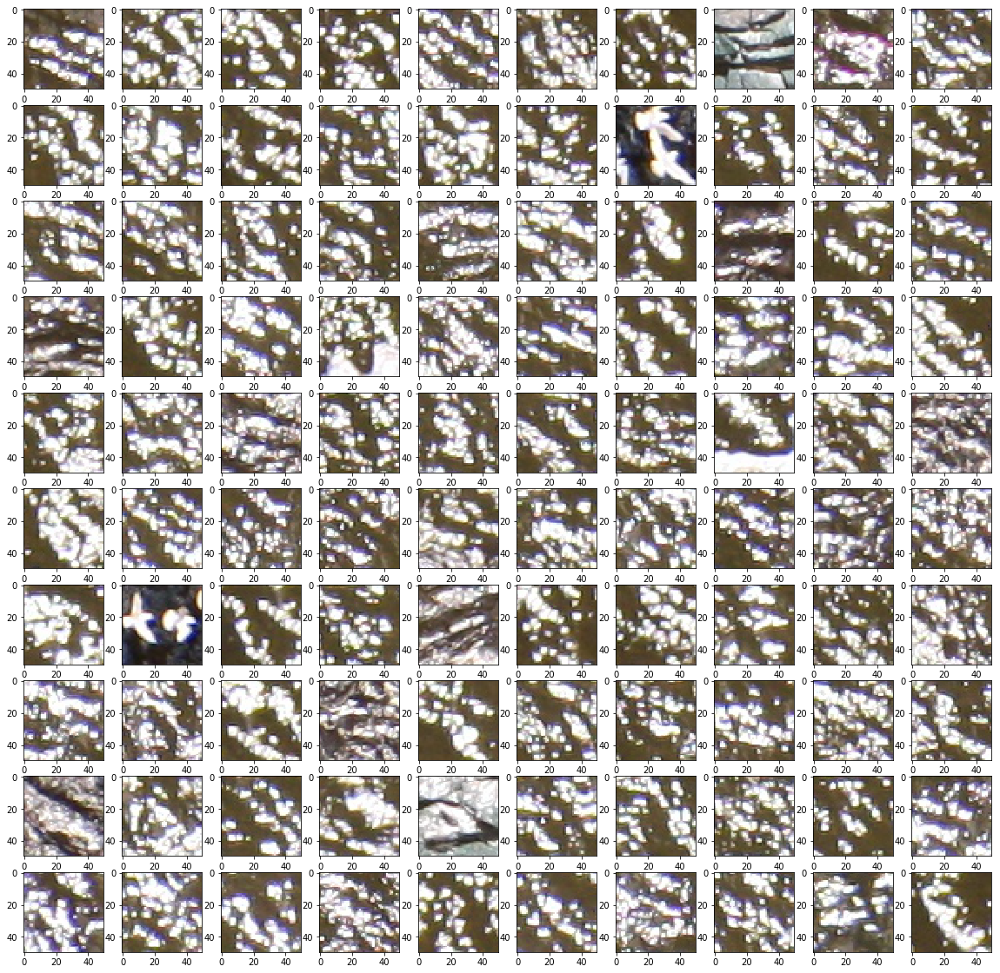

2017-05-21 02:08:32,343 INFO > [done]    generating image patches. rows=11; cols=10 (7999.456 ms)


In [21]:
import numpy as np
import skimage.feature as feature
import skimage.transform as transform
from sklearn.feature_extraction import image
from itertools import permutations

img_path = INPUT_DIR2 + '47.jpg'
img = cv2.imread(img_path)
#img = img[1800:4000,2000:3300]
#img = img[3000:4000,2500:3500]
#img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY).astype('u1')

# def eval_region(im):
#     hist = cv2.calcHist([cv2.cvtColor(im,cv2.COLOR_BGR2HSV)],[0], None, [64], [0,180])
#     r = True
#     for i in range(len(hist)):
#         if(hist[i] < X_train_hist_min[i] or hist[i] > X_train_hist_max[i]):
#             r = False
#     if r:
#         return 255
#     else:
#         return 0

def eval_region(region_img):
    try:
        region_chog = [ch.extract(cv2.cvtColor(region_img,cv2.COLOR_BGR2GRAY).astype('u1'))]
        score = svm_model.predict_proba(region_chog)
    except:
        return 0
    return score[0][1] * 255

img2 = img.copy()

print('preparing blur')
img2 = cv2.GaussianBlur(img2,(5,5),3)

region_generator = objectdetect.sliding_window_generator(img2, step=(19,19), window=IMAGE_DIMS, pyramid_max_layers=1)
good_regions, imgs = objectdetect.evaluate_regions(region_generator, eval_region, score_threshold=200, apply_non_max_suppression=True, supression_overlap_threshold=0.3, threads=None)

# NR_SPLITS = 3
# s0 = int(img2.shape[1]/NR_SPLITS)
# s1 = int(img2.shape[0]/NR_SPLITS)

# good_regions = np.array([])
# imgs = []

# for idx in permutations(range(NR_SPLITS), 2):
#     region_generator = objectdetect.sliding_window_generator(img2[idx[0]*s0:idx[0]*s0+s0,idx[1]*s1:idx[1]*s1+s1], step=(19,19), window=IMAGE_DIMS, pyramid_max_layers=1)
#     good_regions0, imgs0 = objectdetect.evaluate_regions(region_generator, eval_region, score_threshold=200, apply_non_max_suppression=True, supression_overlap_threshold=0.3, threads=None)
#     good_regions = np.concatenate((good_regions, good_regions0))
#     imgs += imgs0

print('regions found:')
print(len(good_regions))

patches = []
for i, region in enumerate(good_regions):
    score = int(good_regions[i][4])
    p = img[region[0]:region[0]+region[2],region[1]:region[1]+region[3]]
    patches.append(p)
    cv2.rectangle(img2, (region[1],region[0]), (region[3]+region[1],region[2]+region[0]), color=(score,score,score), thickness=2)    

utils.show_image(img2, size=40, is_bgr=True)
utils.show_images(patches[0:100], size=2, cols=10)

### Test model

In [17]:
logger.info('Evaluating svm model performance (' + str(len(Y_true)) + ' samples)...')
X_test, Y_test = utils.dump_xy_to_array(valid_balance_generator.flow(), valid_balance_generator.size, x=True, y=True)
X_test = utils.extract_hogs(X_test)
Y_test = utils.onehot_to_label(Y_test)
Y_test_pred = svm_model.predict(X_test)
utils.evaluate_predictions(Y_test, Y_test_pred)

NameError: name 'Y_true' is not defined

In [ ]:
from random import randint
from time import sleep

t = randint(0,1)
sleep(t)
print('run ' + str(a) + ' ' + str(b))
return 'here! ' + str(a+b), a+b

with Pool(processes=4) as p:
    a = p.starmap(run_test, [(a,6) for a in test_generator()])
    print(a)
    b = np.array(a)
    print(b[:,1])


In [ ]:
a = [[1,2],[3,4]]
b = [[5,6],[7,8]]
np.min(a, axis=1)